<center>
    <img src="https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/assets/logos/SN_web_lightmode.png" width="300" alt="cognitiveclass.ai logo">
</center>


# **Singular-Value Decomposition (SVD)**

You are a computer vision engineer and a self-driving car company has hired you.  The company would like you to remove all objects other than the street from several security videos using singular value decomposition to help test their vision system. You will use the  <a href="www.svcl.ucsd.edu/projects/background_subtraction/ucsdbgsub_dataset.html"> Background Subtraction in Dynamic dataset  </a> from the  Statistical Visual Computing Laboratory (SVCL) at UCSD.
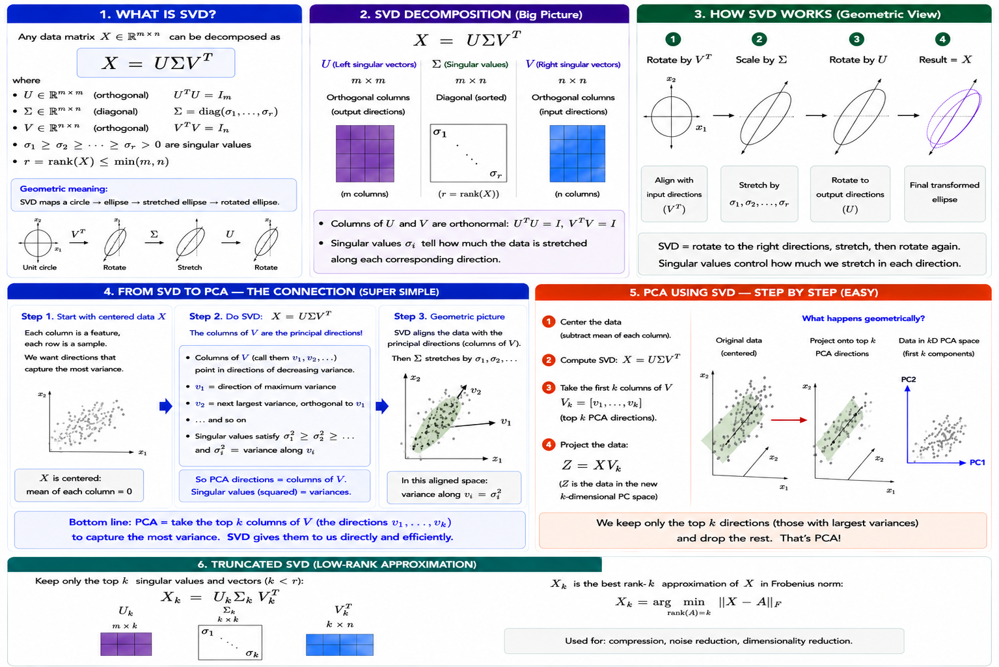
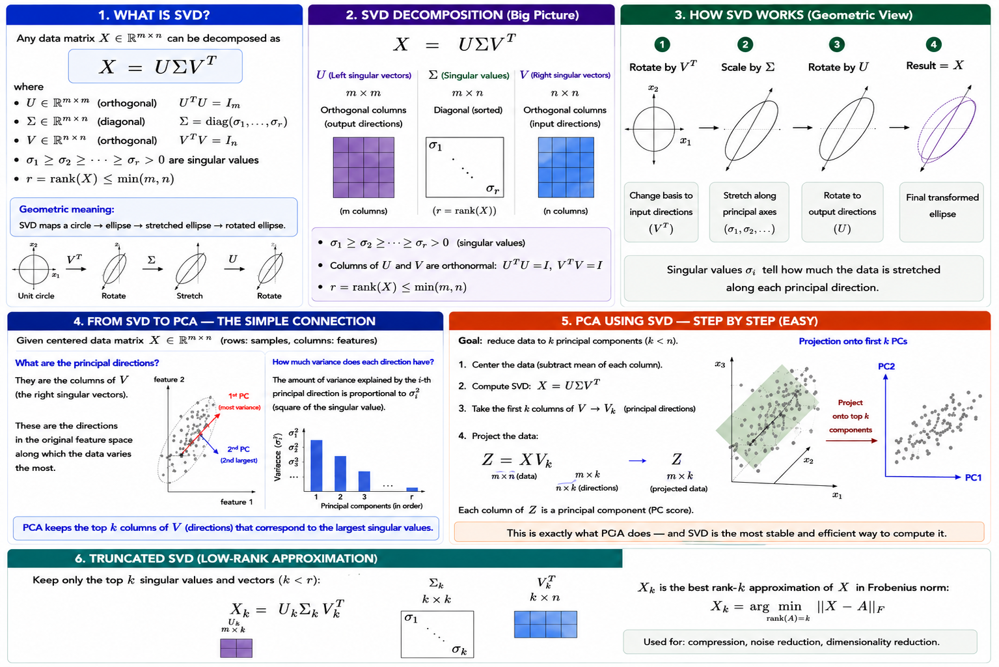

## __Table of Contents__

1. [Objectives](<#Objectives>)
2. [Datasets](<#Datasets>)
3. [Setup](<#Setup>)
    1. [Installing required libraries](<#Installing--required-libraries>)
    2. [Importing Required Libraries](<#Importing-Required-Libraries>)
    3. [Defining Helper functions](<#Defining-Helper-functions>)
4. [Singular Value Decomposition](<#Singular-Value-Decomposition>)
5. [Truncated SVD](<#Truncated-SVD>)
    1. [Truncated SVD in Sklearn](<#Truncated-SVD-in-Sklearn>)
    2. [Background Model using SVD](<#Background-Model-using-SVD>)
6. [Exercises](<#Exercises>)
    1. [Exercise 1](<#Exercise-1>)
    2. [Exercise 2](<#Exercise-2>)
    3. [Exercise 3](<#Exercise-3>)
    4. [Exercise 4](<#Exercise-4>)
    5. [Exercise 5](<#Exercise-5>)
7. [SVD from Scratch (optional)](<#SVD-from-Scratch-(optional)>)
8. [Relationship between SVD and PCA (optional)](<#Relationship-between-SVD-and-PCA-(optional)>)


***


## **Objectives**


*   **Understand** what is SVD in terms of Matrix Decomposition
*   **Understand** Truncated SVD 
*   **Apply** Truncated SVD  using numpy and Sklearn
*   **Apply** Truncated SVD  to real data 
*   **Understand** the relationship between SVD and PCA (optional)


## **Datasets**


Download and unzip the datasets:


In [1]:
import skillsnetwork

await skillsnetwork.prepare(
    "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBM-ML0187EN-SkillsNetwork/labs/module%203/data/traffic.tar.gz",
    overwrite=True,
)
await skillsnetwork.prepare(
    "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBM-ML0187EN-SkillsNetwork/labs/module%203/data/peds.tar.gz",
    overwrite=True,
)
await skillsnetwork.prepare(
    "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBM-ML0187EN-SkillsNetwork/labs/module%203/data/boats.tar.gz",
    overwrite=True,
)

  0%|          | 0/382 [00:00<?, ?it/s]

Saved to '.'


  0%|          | 0/341 [00:00<?, ?it/s]

Saved to '.'


  0%|          | 0/64 [00:00<?, ?it/s]

Saved to '.'


## **Setup**


For this lab, we will be using the following libraries:

*   [`pandas`](https://pandas.pydata.org/?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMML240ENSkillsNetwork34171862-2022-01-01) for managing the data.
*   [`numpy`](https://numpy.org/?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMML240ENSkillsNetwork34171862-2022-01-01) for mathematical operations.
*   [`seaborn`](https://seaborn.pydata.org/?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMML240ENSkillsNetwork34171862-2022-01-01) for visualizing the data.
*   [`matplotlib`](https://matplotlib.org/?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMML240ENSkillsNetwork34171862-2022-01-01) for visualizing the data.
*   [`sklearn`](https://scikit-learn.org/stable/?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMML240ENSkillsNetwork34171862-2022-01-01) for machine learning and machine-learning-pipeline related functions.


### **Installing  required libraries**


The following required modules are pre-installed in the Skills Network Labs environment. However, if you run this notebook commands in a different Jupyter environment (e.g. Watson Studio or Anaconda) you will need to install these libraries by removing the `#` sign before `!mamba` in the code cell below.


In [2]:
# All Libraries required for this lab are listed below. The libraries pre-installed on Skills Network Labs are commented.
# !mamba install -qy pandas==1.3.4 numpy==1.21.4 seaborn==0.9.0 matplotlib==3.5.0 scikit-learn==0.20.1
# Note: If your environment doesn't support "!mamba install", use "!pip install pandas==1.3.4 ..."

Install <a href="https://www.sympy.org/en/index.html?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMML0187ENSkillsNetwork821-2023-01-01">SymPy </a> for printing matrices 


In [3]:
#!conda install -c anaconda sympy -y

### **Importing Required Libraries**

_We recommend you import all required libraries in one place (here):_


In [4]:
# Surpress warnings:
def warn(*args, **kwargs):
    pass


import warnings

warnings.warn = warn

In [5]:
import pandas as pd
import numpy as np 


from os import listdir,getcwd
from os.path import isfile, join
from random import randint
from PIL import Image

import seaborn as sns 
import matplotlib.pylab as plt
%matplotlib inline

from sklearn.decomposition import PCA
from sklearn.decomposition import TruncatedSVD


from sympy import Matrix, init_printing,Symbol
from numpy.linalg import qr,eig,inv,matrix_rank,inv,svd
init_printing()

### **Defining Helper functions**


In [6]:
def get_data_Matrix(mypath="peds"):
    cwd = getcwd()

    mypath = join(cwd, mypath)
    files = [
        join(mypath, f)
        for f in listdir(mypath)
        if isfile(join(mypath, f)) and f.startswith(".") == False
    ]
    # Read image
    img = Image.open(files[0])
    I = np.array(img)
    # Output Images

    Length, Width = I.shape

    X = np.zeros((len(files), Length * Width))
    for i, file in enumerate(files):
        img = Image.open(file)
        I = np.array(img)
        X[i, :] = I.reshape(1, -1)
    return X, Length, Width

## **Singular Value Decomposition**

Singular Value Decomposition, or SVD, is a way to factor a matrix into simpler pieces. For a real or complex matrix $\mathbf{X}$ with $N$ rows, $D$ columns, and rank $r$, SVD writes the matrix into simpler components:

$$
\mathbf{X}=\mathbf{U}\mathbf{S}\mathbf{V}^{T}
$$

where:
- $U$ contains the left singular vectors
- $S$ contains the singular values
- $V^\mathsf{T}$ contains the right singular vectors

The matrices $U$ and $V$ describe important directions in the data, while the **singular values** in $S$ measure the importance (weights) of those directions.

Large singular values correspond to strong patterns in the data. Small singular values often represent weaker patterns, noise, or redundant information.

Geometrically, SVD describes a matrix transformation as:

1. a rotation,
2. followed by stretching or compression,
3. followed by another rotation.

The singular values are ordered from largest to smallest:
$$
\sigma_1 \ge \sigma_2 \ge \cdots \ge \sigma_r \ge 0
$$

where $r$ is the rank of the matrix.

Many datasets contain redundant information, so we often keep only the largest $k$ singular values and their corresponding vectors:

$$
\mathbf{X}\approx\mathbf{U}_{k}\mathbf{S}_{k}\mathbf{V}_{k}^{T}
$$

This produces a lower-dimensional approximation that preserves the strongest patterns in the data while reducing complexity.

SVD is widely used in:

- PCA
- image compression
- recommender systems
- noise reduction
- latent feature extraction

In NumPy:

```python
U, S, VT = np.linalg.svd(X)
```

NumPy returns $V^\mathsf{T}$ instead of $V$, where the rows of `VT` are the right singular vectors.

The columns of $\mathbf{U}$ are called the **left singular vectors**. They describe directions in the output, or observation, space of $\mathbf{X}$.

The columns of $\mathbf{V}$ are called the **right singular vectors**. They describe directions in the feature space of $\mathbf{X}$. NumPy returns $\mathbf{V}^{T}$ instead of $\mathbf{V}$, so the right singular vectors appear as the rows of `VT`.


For a non-square matrix, the full SVD can include extra rows or columns that do not add new information. The figure below shows this full decomposition. Later, we will use the compact, or skinny, version of SVD to keep only the useful parts.


<img src="https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBM-ML0187EN-SkillsNetwork/labs/module%203/images/matrix.png" width="600" alt="full svd">


Consider the following matrix $\mathbf{X}$:


In [7]:
X = np.array([[1.0, 2], [2, 1], [3, 3]])
Matrix(X)

⎡1.0  2.0⎤
⎢        ⎥
⎢2.0  1.0⎥
⎢        ⎥
⎣3.0  3.0⎦

We can compute the SVD of $\mathbf{X}$ with `svd` from `numpy.linalg`:


In [8]:
U, s, VT = svd(X, full_matrices=False)

For a 2D array, NumPy returns `U`, `s`, and `VT`, where `s` is a 1D array of singular values. To reconstruct the matrix, we convert `s` into the diagonal matrix $\mathbf{S}$ with `np.diag(s)` and compute:

$$
\mathbf{X}=\mathbf{U}\,\text{diag}(s)\,\mathbf{V}^{T}
$$

Here we use `full_matrices=False`, which returns the compact, or skinny, SVD. This removes the extra zero-valued parts of the full decomposition and keeps only the pieces needed to reconstruct $\mathbf{X}$.


<img src="https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBM-ML0187EN-SkillsNetwork/labs/module%203/images/skinny-SVD.png" width="600" alt="skinnysvd">


`U` contains the left singular vectors of $\mathbf{X}$:


In [9]:
Matrix(U)

⎡-0.408248290463863   0.707106781186547  ⎤
⎢                                        ⎥
⎢-0.408248290463863   -0.707106781186548 ⎥
⎢                                        ⎥
⎣-0.816496580927726  1.94289029309402e-16⎦

`s` contains the singular values of $\mathbf{X}$. Since NumPy returns them as a 1D array, we use `np.diag(s)` to create the diagonal matrix $\mathbf{S}$:


In [10]:
S = np.diag(s)

Matrix(S)

⎡5.19615242270663  0.0⎤
⎢                     ⎥
⎣      0.0         1.0⎦

`VT` contains $\mathbf{V}^{T}$. Therefore, the right singular vectors are stored as the rows of `VT`:


In [11]:
Matrix(VT)

⎡-0.707106781186548  -0.707106781186547⎤
⎢                                      ⎥
⎣-0.707106781186547  0.707106781186548 ⎦

Now we can reconstruct $\mathbf{X}$ by multiplying the three SVD components:


In [12]:
X_ = U @ S @ VT
X_ = np.round(X_)
Matrix(X_)

⎡1.0  2.0⎤
⎢        ⎥
⎢2.0  1.0⎥
⎢        ⎥
⎣3.0  3.0⎦

Another way to understand SVD is as a sum of simpler matrices. If $r$ is the rank of $\mathbf{X}$, then $\mathbf{X}$ can be written as a weighted sum of $r$ rank-1 matrices:


$$\mathbf{X}=\sum_{i=1}^{r}\sigma_i\mathbf{u}_i\mathbf{v}_i^{T}$$


In [13]:
X_2 = s[0] * U[:, 0:1] @ VT[0:1, :] + s[1] * U[:, 1:2] @ VT[1:2, :]
Matrix(X_2)

⎡0.999999999999999         2.0       ⎤
⎢                                    ⎥
⎢       2.0         0.999999999999999⎥
⎢                                    ⎥
⎣       3.0                3.0       ⎦

The reconstructed matrix matches the original matrix, except for very small numerical rounding differences.


## **Truncated SVD**


In the previous section, we wrote SVD as one matrix product:

$$
\mathbf{X}=\mathbf{U}\mathbf{S}\mathbf{V}^{T}
$$

The same SVD can also be written as a sum of rank-1 matrices:

$$
\mathbf{X} = \sum_{i=1}^{r} \sigma_i \mathbf{u}_i \mathbf{v}_i^T
$$

Each term

$$
\sigma_i \mathbf{u}_i \mathbf{v}_i^T
$$

is one rank-1 component, or one "ingredient" of the original matrix. Adding all $r$ components gives the same matrix $\mathbf{X}$ as $\mathbf{U}\mathbf{S}\mathbf{V}^{T}$. These are not two different methods; they are two ways to write the same SVD.

The singular value $\sigma_i$ measures how important that component is. Large singular values preserve more variance and information, while small singular values contribute very little and are often treated as redundancy or noise.

Since small singular values contain less useful information, we can keep only the first $L$ most important components, where $L < r$:

$$
\mathbf{X} \approx \sum_{i=1}^{L} \sigma_i \mathbf{u}_i \mathbf{v}_i^T
$$

This is called **Truncated SVD**, or a **low-rank approximation**.

The important difference is:

- **SVD** = use all $r$ components, so the matrix can be reconstructed exactly.
- **Truncated SVD** = use only the first $L$ components, so the matrix is reconstructed approximately but with less complexity.

$$\mathbf{X}\approx\sum_{i=1}^{L}\sigma_i\mathbf{u}_i\mathbf{v}_i^{T}$$


Consider the following matrix, the columns are almost linearly independent:


In [14]:
X = np.array([[1, 2], [2, 4], [4, 8.0001]])
Matrix(X)

⎡1.0   2.0  ⎤
⎢           ⎥
⎢2.0   4.0  ⎥
⎢           ⎥
⎣4.0  8.0001⎦

We perform SVD:


In [15]:
U, s, VT = svd(X, full_matrices=False)
S = np.diag(s)
Matrix(S)

⎡10.2470288381327          0.0        ⎤
⎢                                     ⎥
⎣      0.0         2.18216227635996e-5⎦

We see the first rank-1 matrix is almost identical to the Matrix:


In [16]:
X_hat = np.round(s[0] * U[:, 0:1] @ VT[0:1, :])
Matrix(X_hat)

⎡1.0  2.0⎤
⎢        ⎥
⎢2.0  4.0⎥
⎢        ⎥
⎣4.0  8.0⎦

Instead of adding the rank-1 matrices, we can achieve the same result with matrix multiplications. Select the top $L$ singular values, top $L$ left and right singular vectors, we can approximate $\mathbf{X}$ by:


$$\mathbf{X} \approx \mathbf{U}_{:,1:L} \mathbf{S}_{1:L,1:L} \mathbf{V}_{1:L,:}^{T}$$


Summarized in the following image:


<img src="https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBM-ML0187EN-SkillsNetwork/labs/module%203/images/trunked_-svd.png" width="600" alt="skinnysvd">


We can code the values in numpy:


In [17]:
L = 1
Xhat = U[:, :L] @ S[0:L, 0:L] @ VT[:L, :]
Matrix(Xhat)

⎡0.999992380977777  2.00000380947483⎤
⎢                                   ⎥
⎢1.99998476195556   4.00000761894966⎥
⎢                                   ⎥
⎣4.00000952368254   8.00009523820408⎦

We can use the singular values to determine the reconstruction error, similar to the **cumulative explained variance**, we will go into the exact relationship later. The term is given by: 


$$C(L)=\dfrac{\sum_{i=1}^{L}\sigma_i}{\sum_{i=1}^{r}\sigma_i}$$


In [18]:
print(
    f"With {L} singular value and its corresponding singular vectors, {s[0:L]/s.sum()} variance of X is explained"
)

With 1 singular value and its corresponding singular vectors, [0.99999787] variance of X is explained


We can plot the **cumulative explained variance** as a function of $L$ (the number of singular values chosen).


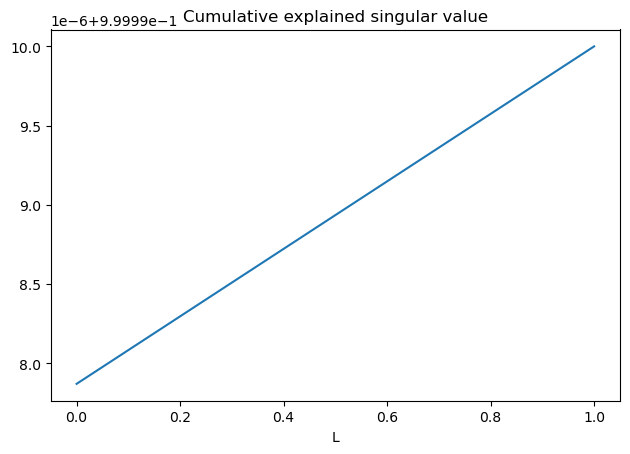

In [19]:
plt.figure()
plt.plot(np.cumsum(s) / s.sum())
plt.xlabel("L")
plt.title("Cumulative explained singular value")
plt.tight_layout()
plt.show()

### **Truncated SVD in Sklearn**


Truncated SVD  performs **linear  PCA**, a method of dimensionality reduction. Contrary to PCA, this estimator does not center the data before computing the singular value decomposition. This means it can work with sparse matrices efficiently. We will explore the relationship between PCA and SVD later on. 

Some important parameters in `sklearn.decomposition.TruncatedSVD` that are worth noting:

- `n_components`: int, default=2; Desired dimensionality of output data. If algorithm=’arpack’, must be strictly less than the number of features. If algorithm=’randomized’, must be less than or equal to the number of features. The default value is useful for visualisation.

- `algorithm`: {‘arpack’, ‘randomized’}, default=’randomized’; SVD solver to use. Either “arpack” for the ARPACK wrapper in SciPy (scipy.sparse.linalg.svds), or “randomized” for the randomized algorithm due to [Halko (2009)](https://arxiv.org/abs/0909.4061?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMML0187ENSkillsNetwork821-2023-01-01).

- `n_iter`: int, default=5; Number of iterations for randomized SVD solver. Not used by ARPACK. The default is larger than the default in [randomized_svd](https://scikit-learn.org/stable/modules/generated/sklearn.utils.extmath.randomized_svd.html?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMML0187ENSkillsNetwork821-2023-01-01#sklearn.utils.extmath.randomized_svd) to handle sparse matrices that may have large slowly decaying spectrum.

_Read more in the scikit-learn documentation of [TruncatedSVD](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.TruncatedSVD.html?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMML0187ENSkillsNetwork821-2023-01-01)._


First we create a ```TruncatedSVD``` object setting ```n_components=1``` this is analogous to ```L=1``` :


In [20]:
svd_ = TruncatedSVD(n_components=1, random_state=42) # Initialize TruncatedSVD with 1 component

```fit_transform```  behaves like the projections onto the principle components 


In [21]:
Z = svd_.fit_transform(X) # Apply TruncatedSVD to X and get the transformed data in Z
Z

array([[2.23606798],
       [4.47213595],
       [8.94436135]])

With `inverse_transform`, we can find the approximation of the original $X$:


In [22]:
Xhat = svd_.inverse_transform(Z)
Matrix(np.round(Xhat))

⎡1.0  2.0⎤
⎢        ⎥
⎢2.0  4.0⎥
⎢        ⎥
⎣4.0  8.0⎦

### **Background Model using SVD**


In this section you will use SVD for developing a Background Model. 

Background subtraction is a widely used approach to detect moving objects in a sequence of frames from static cameras. The base in this approach is detecting moving objects from the differences between the current frame and reference frame, which is often called 'Background Image' or 'Background Model'. 

The function ```get_data_Matrix```  will create a Design  matrix ```X``` where each row corresponds to a flattened image of a sidewalk with pedestrians recorded by a camera.

```Length``` and ```Width``` are the rectangular dimensions of the image. We will use SVD to remove the pedestrians: 


In [23]:
X, Length, Width = get_data_Matrix(mypath="peds") # Get the data matrix X and its dimensions Length and Width from the "peds" directory

There are 170 images in the dataset and each is $152\times 232$ (32654 pixels).


In [24]:
X.shape, Length, Width

We can plot five random images from the matrix:


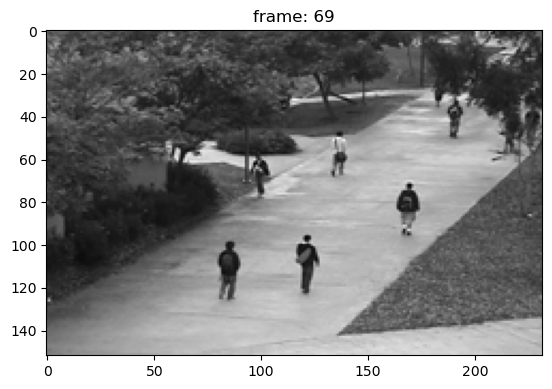

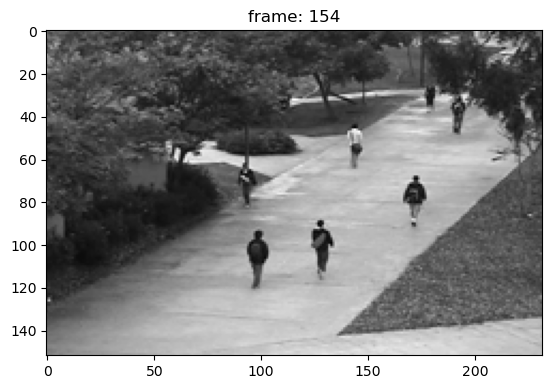

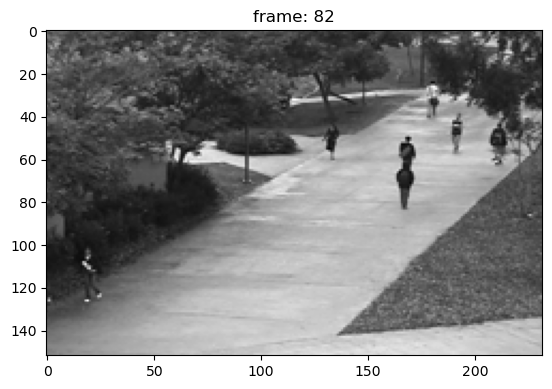

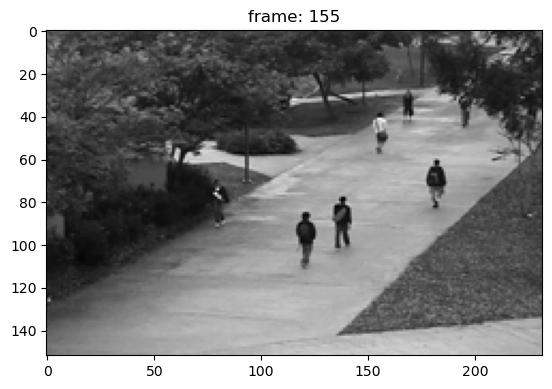

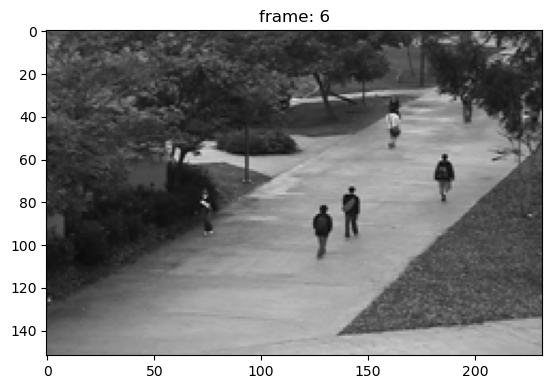

In [25]:
for i in range(5):
    frame = randint(0, X.shape[0] - 1) # select a random frame index
    plt.imshow(
        X[randint(0, X.shape[0] - 1), :].reshape(Length, Width), cmap="gray" # reshape the selected frame and display as image
    )
    plt.title("frame: " + str(frame))
    plt.show()

We perform SVD on the images:


In [26]:
U, s, VT = svd(X, full_matrices=False) # Perform Singular Value Decomposition on X to get U, s, and VT

In [27]:
S = np.diag(s) # Create a diagonal matrix S from the singular values s

We can reconstruct the image using Truncated SVD with ```L=1``` and assign the result to to ```Xhat```:


In [28]:
L = 1
Xhat = U[:, :L] @ S[0:L, 0:L] @ VT[:L, :]

If we plot the first image, we will see the pedestrians are gone:


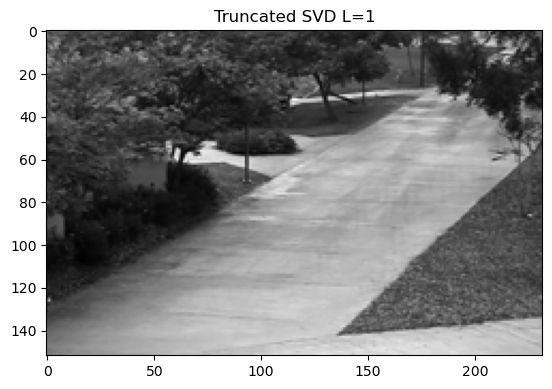

In [29]:
plt.imshow(Xhat[0, :].reshape(Length, Width), cmap="gray")
plt.title("Truncated SVD L=1")
plt.show()

## **Exercises**


### **Exercise 1**

Reshape the 5 random rows of ```Xhat``` and plot them as images.


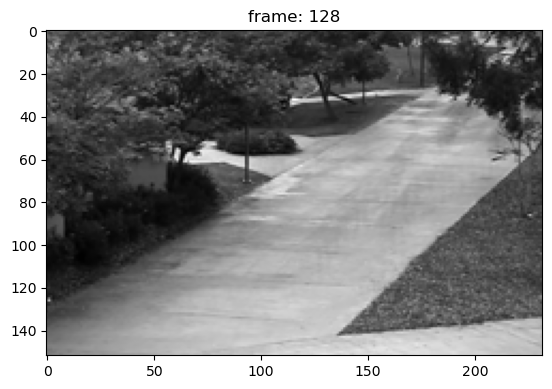

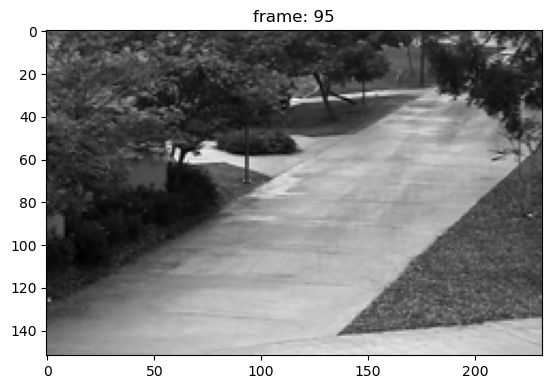

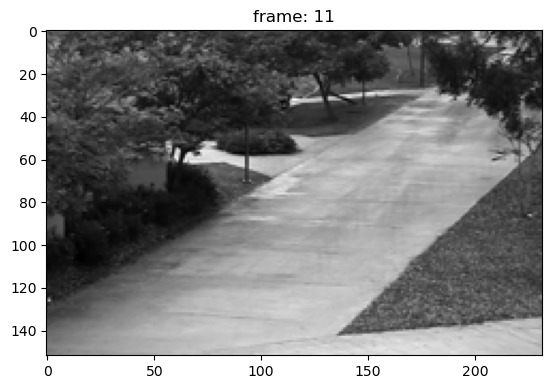

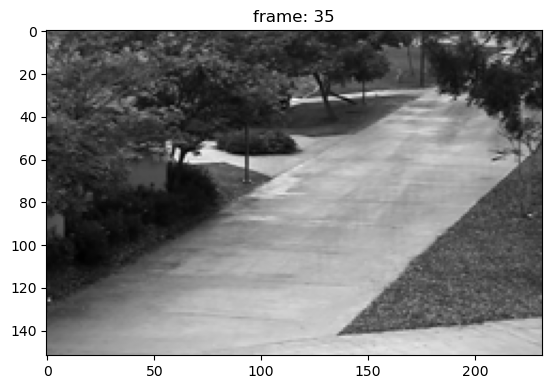

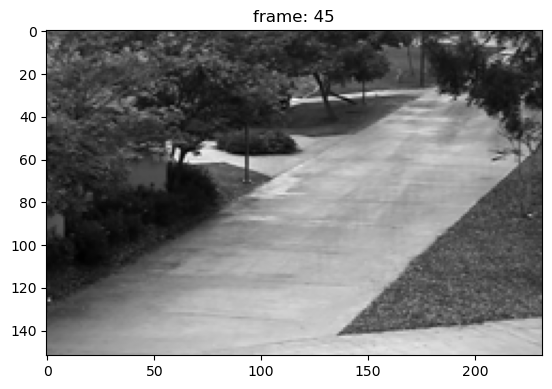

In [30]:
# TODO
for i in range(5):
    frame = randint(0, X.shape[0] - 1) # select a random frame index
    plt.imshow(
        Xhat[randint(0, X.shape[0] - 1), :].reshape(Length, Width), cmap="gray" # reshape the selected frame and display as image
    )
    plt.title("frame: " + str(frame))
    plt.show()

From the exercise above that the rows of the matrix ```Xhat``` are all similar . The ```L``` determines the reconstruction properties.


### **Exercise 2**

Plot the Cumulative explained variance against the number of singular values $L$.


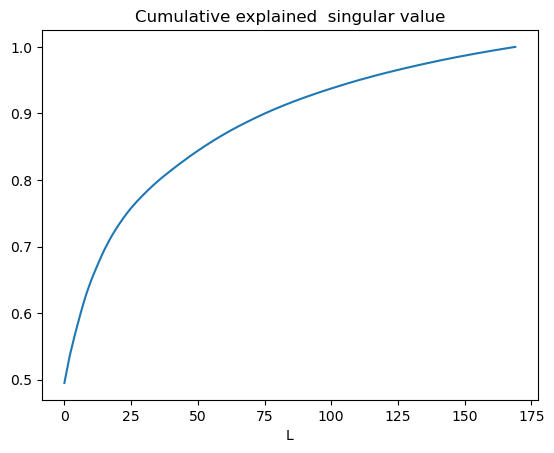

In [31]:
# TODO
plt.plot(np.cumsum(s) / s.sum())
plt.xlabel("L")
plt.title("Cumulative explained  singular value")
plt.show()

### **Exercise 3**
Perform Truncated SVD with ```L=10``` and plot 5 random rows of Xhat.


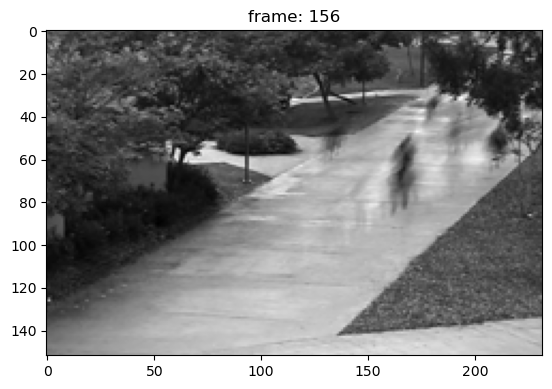

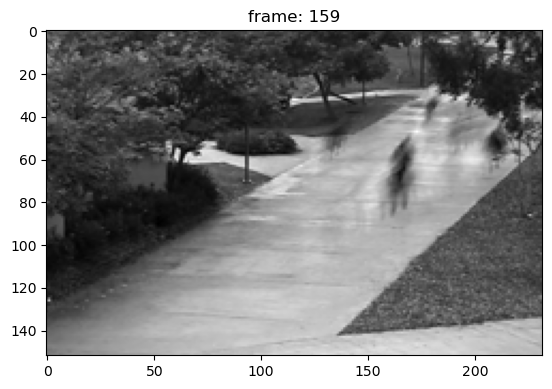

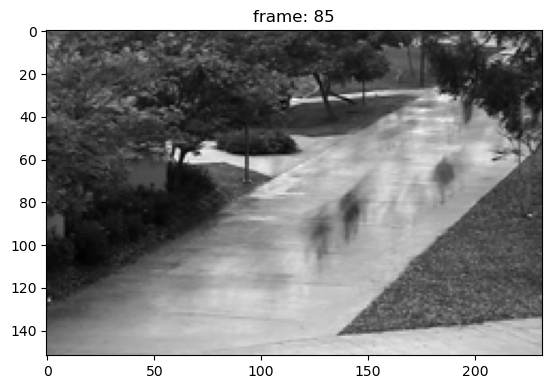

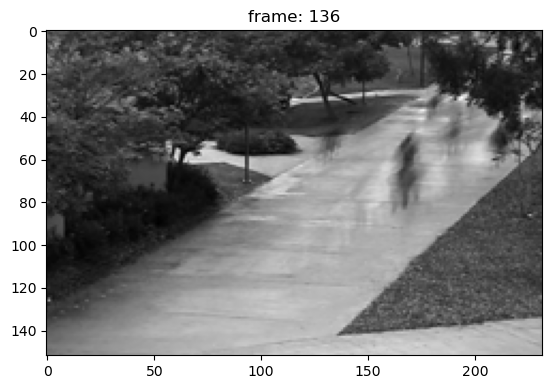

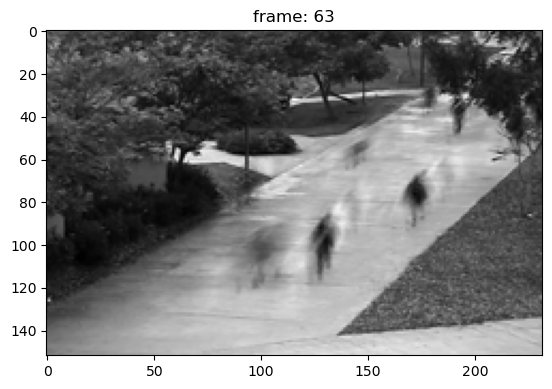

In [32]:
# TODO
L = 10
Xhat = U[:, :L] @ S[0:L, 0:L] @ VT[:L, :]
for i in range(5):
    frame = randint(0, X.shape[0] - 1)
    plt.imshow(
        Xhat[randint(0, X.shape[0] - 1), :].reshape(Length, Width), cmap="gray"
    )
    plt.title("frame: " + str(frame))
    plt.show()

### **Exercise 4**
 Apply   ```get_data_Matrix``` with ```mypath="boats"```, plot 5 random boat images. Then perform Truncated SVD using the function ```svd``` with  L=1 and plot the first row of ```Xhat``` as an image.


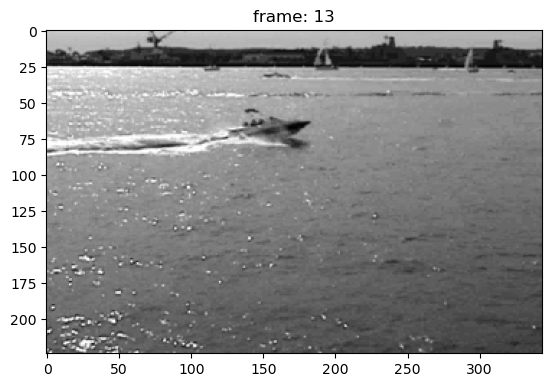

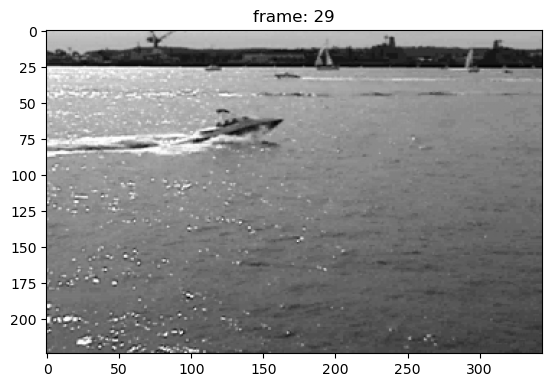

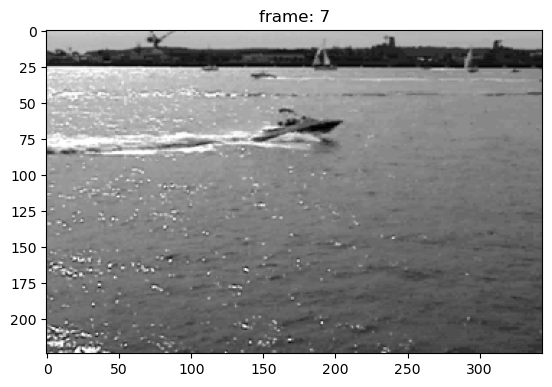

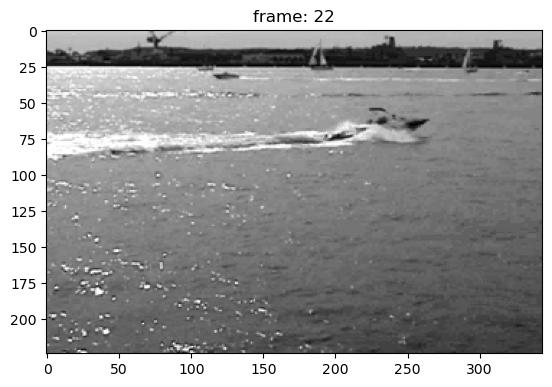

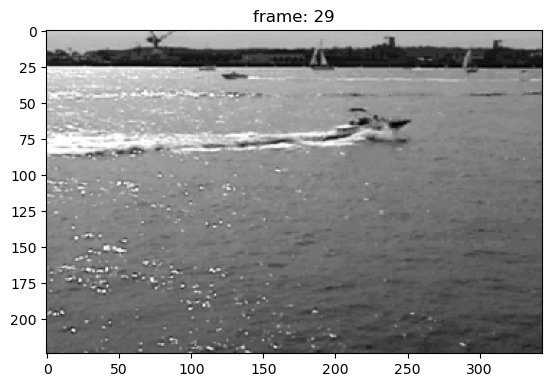

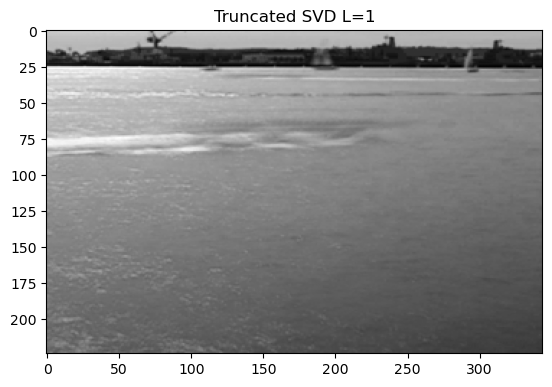

In [33]:
# TODO

X, Length, Width = get_data_Matrix(mypath="boats")

for i in range(5):
    frame = randint(0, X.shape[0] - 1)
    plt.imshow(
        X[randint(0, X.shape[0] - 1), :].reshape(Length, Width), cmap="gray"
    )
    plt.title("frame: " + str(frame))
    plt.show()

U, s, VT = svd(X, full_matrices=False)
L = 1
Xhat = U[:, :L] @ S[0:L, 0:L] @ VT[:L, :]

plt.imshow(Xhat[0, :].reshape(Length, Width), cmap="gray")
plt.title("Truncated SVD L=1")

plt.show()

### **Exercise 5**
Apply   ```get_data_Matrix``` with ```mypath="traffic"```, plot 5 random images. Then perform Truncated SVD  using `TruncatedSVD` with ```n_components=1``` and plot the first row of ```Xhat``` as an image.


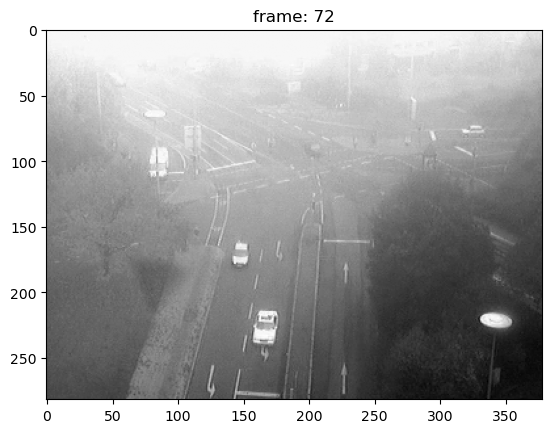

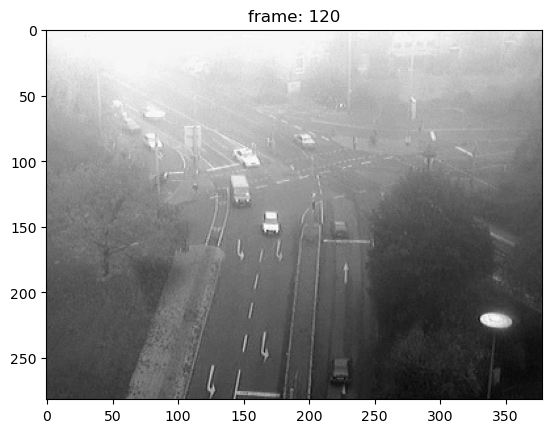

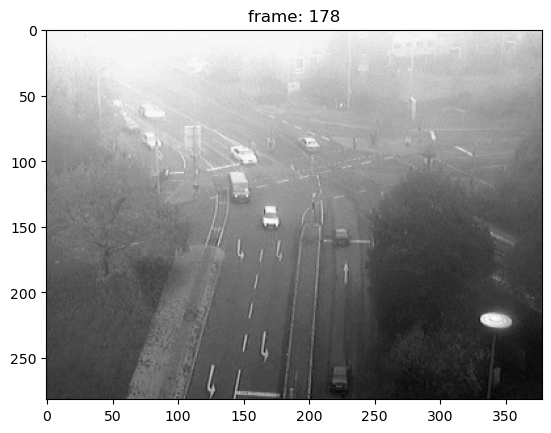

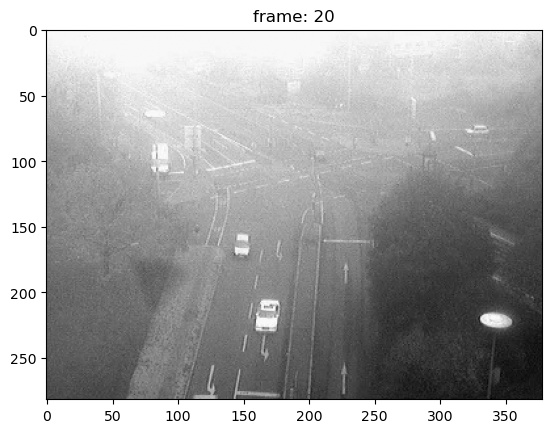

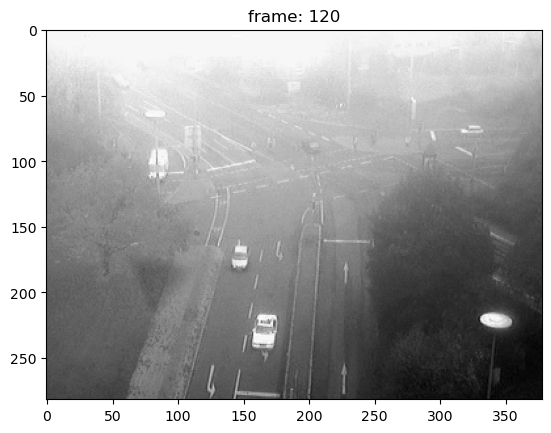

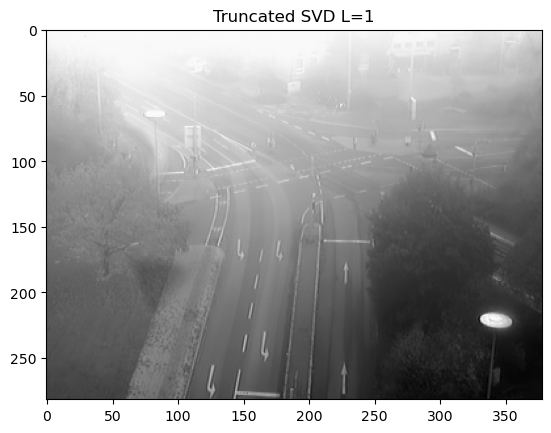

In [34]:
# TODO

X, Length, Width = get_data_Matrix(mypath="traffic")

for i in range(5):
    frame = randint(0, X.shape[0] - 1)
    plt.imshow(
        X[randint(0, X.shape[0] - 1), :].reshape(Length, Width), cmap="gray"
    )
    plt.title("frame: " + str(frame))
    plt.show()

svd_ = TruncatedSVD(n_components=1, n_iter=7, random_state=42)
score = svd_.fit_transform(X)
Xhat = svd_.inverse_transform(score)
plt.imshow(Xhat[0, :].reshape(Length, Width), cmap="gray")
plt.imshow(Xhat[0, :].reshape(Length, Width), cmap="gray")
plt.title("Truncated SVD L=1")

plt.show()
plt.show()

##  **SVD from Scratch (optional)**


There are several ways to derive SVD, let's do one that is simple to code and related to PCA. We have the SVD factorization:


$$\mathbf{X}= \mathbf {US V^{T}}$$


In [35]:
X = np.array([[1, 2], [2, 4], [4, 8]])
Matrix(X)

⎡1  2⎤
⎢    ⎥
⎢2  4⎥
⎢    ⎥
⎣4  8⎦

From the last section you recall that $DxD$  matrix $\mathbf{C}$   is a symmetric matrix, this is almost  the same matrix used in PCA if we can scale the covariance matrix by $N$ and obtain the eigenvalues and eigenvectors (eigenvectors have unit norm so multiplying constant will not effect them): 


$$\mathbf{C'}=\mathbf{X}^T \mathbf{X}=\mathbf{V}\mathbf{\Lambda}\mathbf{V}^{T}$$


The $\mathbf{V}$ is the same as the right singular vectors, in Python we can evaluate ```V``` as follows: 


In [36]:
C = X.T @ X
eigen_vectors1, V = eig(C)
Matrix(V)

⎡-0.894427190999916  -0.447213595499958⎤
⎢                                      ⎥
⎣0.447213595499958   -0.894427190999916⎦

We can also perform the same decomposition with the Gram matrix:


$G=\mathbf{X} \mathbf{X}^T= \mathbf{U \Lambda U^{T}}$


Where $\mathbf{U}$ are the the right singular vectors 


In [37]:
G = X @ X.T
eigen_vectors2, U = eig(G)
Matrix(U)

⎡-0.975900072948533  0.218217890235992  6.09220366375494e-17⎤
⎢                                                           ⎥
⎢0.0975900072948533  0.436435780471985   -0.894427190999916 ⎥
⎢                                                           ⎥
⎣0.195180014589707   0.87287156094397    0.447213595499958  ⎦

There are several way to obtains the singular values as we know  $\mathbf{X}= \mathbf {USV^{T}}$. With some algebra we know that $\mathbf{S}=\mathbf{U^TXV}$


In [38]:
S = np.round((U.T @ X @ V))
Matrix(S)

⎡0.0   0.0 ⎤
⎢          ⎥
⎢0.0  -10.0⎥
⎢          ⎥
⎣0.0   0.0 ⎦

Singular values are not in descending order, and the shape difference is because this is not the economy-size decomposition.
Now that we have all the components, we can reconstruct the matrix:


In [39]:
X_ = np.round(U @ S @ V.T)
Matrix(X_)

⎡1.0  2.0⎤
⎢        ⎥
⎢2.0  4.0⎥
⎢        ⎥
⎣4.0  8.0⎦

## **Relationship between SVD and PCA (optional)**



PCA and Singular Value Decomposition (SVD) are closely related dimensionality reduction methods. Both aim to reduce high-dimensional data into a smaller set of components while preserving as much important information as possible.

For a data matrix $X$, SVD decomposes the matrix into three components:

$$
X = U \Sigma V^T
$$

where:

- $U$ contains the left singular vectors
- $\Sigma$ contains the singular values
- $V^T$ contains the right singular vectors

PCA can be computed directly from the covariance matrix:

$$
C = \frac{1}{n-1}X^TX
$$

The principal components in PCA are mathematically equivalent to the right singular vectors obtained from SVD after centering the data.

The main difference is that standard PCA first centers the data by subtracting the feature means, while TruncatedSVD operates directly on the original matrix without centering. 

As a result:
- PCA is commonly used for dense numerical datasets
- TruncatedSVD is commonly used for sparse text data and NLP applications
- both methods often produce similar low-dimensional structures and explained variance patterns

In the section above we derived SVD. Let's use this to better understand how SVD and PCA are almost the same. Let's use the following dateset:


In [40]:
N = 200
u = np.array([[1.0, 1.0], [0.10, -0.10]]) / (2) ** (0.5)
X_ = np.dot(4 * np.random.randn(N, 2), u) + 10
X = X_ - X_.mean(axis=0)

Let's compare SVD to sklearn's PCA  setting ```n_components=1```


In [41]:
U, s, VT = svd(X, full_matrices=False)

In [42]:
pca = PCA(n_components=1)
projection = pca.fit_transform(X)
X_sklearn = pca.inverse_transform(projection)

As $\mathbf{V}$ are the principal components, the projections on the principal components can be found by multiplying $\mathbf{X}$ and $\mathbf{V}$, if we want the projection on the first principal components, we can take the row of $\mathbf{V}$ with the largest Singular-Value Value and compare it to scikit-learn's. We see the result is identical:


In [43]:
projection_ = X @ VT[0, :]
print("error SVD vs scikit-learn's PCA", (projection_ - projection).sum())

error SVD vs scikit-learn's PCA -1.7280399333685637e-11


We can also find the projections using  $\mathbf{XV}= \mathbf {US}$. Here we find the projection on the first principal component to compare to scikit-learn's


In [44]:
projection_ = U @ np.diag(s)[:, 0]
print("error SVD vs scikit-learn's PCA", (projection_ - projection).sum())

error SVD vs scikit-learn's PCA -1.6370904631912708e-11


The inverse transform on the first  principal component is simply the low rank approximation:


In [45]:
L = 1
Xhat = U[:, :L] @ np.diag(s[0:L]) @ VT[:L, :]  # resconstruct X
print("error SVD vs scikit-learn's PCA", ((Xhat - X_sklearn) ** 2).sum())

error SVD vs scikit-learn's PCA 4.184977105613206e-27


The relationship between the explained variance and singular  values are given by  $\lambda_i = s_i^2/(N-1)$ we can verify the for the first singular value:


In [46]:
s[0] ** 2 / (200 - 1)

In [47]:
pca.explained_variance_

array([17.54662275])

## **Authors**


<a href="https://www.linkedin.com/in/joseph-s-50398b136/?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMDeveloperSkillsNetworkML0101ENSkillsNetwork20718538-2021-01-01">Joseph Santarcangelo</a> has a Ph.D. in Electrical Engineering, his research focused on using machine learning, signal processing, and computer vision to determine how videos impact human cognition. Joseph has been working for IBM since he completed his PhD

Su Wu

### **Other Contributors**


[Roxanne Li](https://www.linkedin.com/in/roxanne-li/?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMML0187ENSkillsNetwork821-2023-01-01) is a Data Science intern at IBM Skills Network, entering level-5 study in the Mathematics & Statistics undergraduate Coop program at McMaster University.


## **Change Log**


| Date (YYYY-MM-DD) | Version | Changed By  | Change Description             |
| ----------------- | ------- | ----------- | ------------------------------ |
| 2022-03-25        | 0.1     | Joseph S.   | Updated all content            |
| 2022-04-26        | 0.1     | Svitlana K. | Corrected minor grammar errors |
| 2022-05-26        | 0.1     | Roxanne Li  | Review and edit content    |
| 2022-06-02        | 0.2     | Steve H.    | QA pass     |
| 2026-05-14        | 0.3     | Su Wu       | Documentation and code edits|
